###Model Start

In [0]:
%pip install optuna
%pip install lightgbm
%pip install catboost
# %pip install xgboost

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 0.0/57.7 kB ? eta -:--:--
     ━━━━━━━━━━━━━━━━━━━━━╺━━━━━━━━━━━━━━━━━━ 30.7/57.7 kB 1.7 MB/s eta 0:00:01
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╸━━━━ 51.2/57.7 kB 750.0 kB/s eta 0:00:01
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╸━━━━ 51.2/57.7 kB 750.0 kB/s eta 0:00:01
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 57.7/57.7 kB 476.3 kB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 0.0/400.9 kB ? eta -:--:--
   ━━━━━━━━━╺━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 92.2/400.9 kB 3.6 MB/s eta 0:00:01
   ━━━━━━━━━━━━━━━╺━━━━━━━━━━━━━━━━━━━━━━━━ 153.6/400.9 kB 2.2 MB/s eta 0:00:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━╸━━━━━━━━━━━ 286.7/400.9 kB 3.2 MB/s eta 0:00:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╸ 399.4/400.9 kB 3.1 MB/s eta 0:00:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 400.9/400.9 kB 2.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 0.0/247.8 kB ? eta -:--:--
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 247.8/247.8 kB 7.3 M

In [0]:
from pyspark.sql.functions import *
from pyspark.sql import Window
from pyspark.sql.types import *

import random

import joblib

import pandas as pd
import numpy as np
from scipy import stats
import pyspark.pandas as ps

import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px

import random

from collections import Counter

from datetime import date

from sklearn import metrics
from sklearn.model_selection import train_test_split

import lightgbm as lgb
import catboost as cb
# import xgboost as xgb

import optuna

from pyspark.ml.feature import Imputer
from pyspark.sql.functions import mean

In [0]:
df1 = spark.read.table('BFL_STD_LAKE.SME_COE.dj_plcs_ml_base_reduced_all_vars').filter(col('plcs_flag')==1).sample(0.3)
df2 = spark.read.table('BFL_STD_LAKE.SME_COE.dj_plcs_ml_base_reduced_all_vars').filter(col('plcs_flag')==0).sample(0.03)

In [0]:
df = df1.union(df2)

In [0]:
display(df)

id,customer_id,BUREAUCUSTOMERID,REPORTINGDATETIME,plcs_flag,final_date,ETB_TOTAL_LOANS,ETB_TOTAL_POS,ETB_TOTAL_POS_BALANCE,tier,v3_score,ever_3in1_flag,rnk3in1,CNT_TOTAL_LOAN,CNT_TOTAL_L3M,CNT_TOTAL_L6M,CNT_TOTAL_L12M,CNT_TOTAL_UNSEC,CNT_TOTAL_SEC,CNT_TOTAL_LAP,CNT_TOTAL_AL,CNT_TOTAL_UCF,CNT_TOTAL_HL,CNT_LIVE_UNSEC,CNT_LIVE_SEC,CNT_LIVE_LAP,CNT_LIVE_AL,CNT_LIVE_UCF,CNT_LIVE_HL,CNT_UNSEC_L3M,CNT_UNSEC_L6M,CNT_UNSEC_L12M,CNT_SEC_L3M,CNT_SEC_L6M,CNT_SEC_L12M,CNT_LAP_L3M,CNT_LAP_L6M,CNT_LAP_L12M,CNT_AL_L3M,CNT_AL_L6M,CNT_AL_L12M,CNT_UCF_L3M,CNT_UCF_L6M,CNT_UCF_L12M,CNT_HL_L3M,CNT_HL_L6M,CNT_HL_L12M,MAX_AMT,TOT_AMT,AVG_AMT,MAX_AMT_TOTAL_UNSEC,MAX_AMT_TOTAL_SEC,MAX_AMT_TOTAL_LAP,MAX_AMT_TOTAL_AL,MAX_AMT_TOTAL_UCF,MAX_AMT_TOTAL_HL,MAX_AMT_LIVE_UNSEC,MAX_AMT_LIVE_SEC,MAX_AMT_LIVE_LAP,MAX_AMT_LIVE_AL,MAX_AMT_LIVE_UCF,MAX_AMT_LIVE_HL,MAX_AMT_UNSEC_L3M,MAX_AMT_UNSEC_L6M,MAX_AMT_UNSEC_L12M,MAX_AMT_SEC_L3M,MAX_AMT_SEC_L6M,MAX_AMT_SEC_L12M,MAX_AMT_LAP_L3M,MAX_AMT_LAP_L6M,MAX_AMT_LAP_L12M,MAX_AMT_AL_L3M,MAX_AMT_AL_L6M,MAX_AMT_AL_L12M,MAX_AMT_UCF_L3M,MAX_AMT_UCF_L6M,MAX_AMT_UCF_L12M,MAX_AMT_HL_L3M,MAX_AMT_HL_L6M,MAX_AMT_HL_L12M,SUM_AMT_TOTAL_UNSEC,SUM_AMT_TOTAL_SEC,SUM_AMT_TOTAL_LAP,SUM_AMT_TOTAL_AL,SUM_AMT_TOTAL_UCF,SUM_AMT_TOTAL_HL,SUM_AMT_LIVE_UNSEC,SUM_AMT_LIVE_SEC,SUM_AMT_LIVE_LAP,SUM_AMT_LIVE_AL,SUM_AMT_LIVE_UCF,SUM_AMT_LIVE_HL,SUM_AMT_UNSEC_L3M,SUM_AMT_UNSEC_L6M,SUM_AMT_UNSEC_L12M,SUM_AMT_SEC_L3M,SUM_AMT_SEC_L6M,SUM_AMT_SEC_L12M,SUM_AMT_LAP_L3M,SUM_AMT_LAP_L6M,SUM_AMT_LAP_L12M,SUM_AMT_AL_L3M,SUM_AMT_AL_L6M,SUM_AMT_AL_L12M,SUM_AMT_UCF_L3M,SUM_AMT_UCF_L6M,SUM_AMT_UCF_L12M,SUM_AMT_HL_L3M,SUM_AMT_HL_L6M,SUM_AMT_HL_L12M,AVG_AMT_TOTAL_UNSEC,AVG_AMT_TOTAL_SEC,AVG_AMT_TOTAL_LAP,AVG_AMT_TOTAL_AL,AVG_AMT_TOTAL_UCF,AVG_AMT_TOTAL_HL,AVG_AMT_LIVE_UNSEC,AVG_AMT_LIVE_SEC,AVG_AMT_LIVE_LAP,AVG_AMT_LIVE_AL,AVG_AMT_LIVE_UCF,AVG_AMT_LIVE_HL,AVG_AMT_UNSEC_L3M,AVG_AMT_UNSEC_L6M,AVG_AMT_UNSEC_L12M,AVG_AMT_SEC_L3M,AVG_AMT_SEC_L6M,AVG_AMT_SEC_L12M,AVG_AMT_LAP_L3M,AVG_AMT_LAP_L6M,AVG_AMT_LAP_L12M,AVG_AMT_AL_L3M,AVG_AMT_AL_L6M,AVG_AMT_AL_L12M,AVG_AMT_UCF_L3M,AVG_AMT_UCF_L6M,AVG_AMT_UCF_L12M,AVG_AMT_HL_L3M,AVG_AMT_HL_L6M,AVG_AMT_HL_L12M,MAX_OVERDUE,AVG_IRR_UNSEC,AVG_IRR_SEC,AVG_IRR_LAP,AVG_IRR_AL,AVG_IRR_UCF,AVG_IRR_HL,AVG_IRR,MONTHS_LATEST_UNSEC,MONTHS_LATEST_SEC,MONTHS_LATEST_LAP,MONTHS_LATEST_AL,MONTHS_LATEST_UCF,MONTHS_LATEST_HL,MONTHS_OLDEST_UNSEC,MONTHS_OLDEST_SEC,MONTHS_OLDEST_LAP,MONTHS_OLDEST_AL,MONTHS_OLDEST_UCF,MONTHS_OLDEST_HL,MONTHS_LATEST_LOAN,BUREAU_VINTAGE,ENQ_UNSEC_L3M,ENQ_UNSEC_L6M,ENQ_UNSEC_L12M,ENQ_SEC_L3M,ENQ_SEC_L6M,ENQ_SEC_L12M,ENQ_LAP_L3M,ENQ_LAP_L6M,ENQ_LAPs_L12M,ENQ_AL_L3M,ENQ_AL_L6M,ENQ_AL_L12M,ENQ_UCF_L3M,ENQ_UCF_L6M,ENQ_UCF_L12M,ENQ_HL_L3M,ENQ_HL_L6M,ENQ_HL_L12M,ENQ_BL_L3M,ENQ_BL_L6M,ENQ_BL_L12M,ENQ_PL_L3M,ENQ_PL_L6M,ENQ_PL_L12M,PGE,AGE,CURRENT_AGE,dpd_1plus_24m_bf_date,dpd_30plus_24m_bf_date,dpd_1plus_12m_bf_date,dpd_30plus_12m_bf_date,dpd_1plus_6m_bf_date,dpd_30plus_6m_bf_date,dpd_1plus_3m_bf_date,dpd_30plus_3m_bf_date,CNT_BAJAJ_LOAN,CNT_CAT1_LOAN,CNT_CAT2_LOAN,CNT_CAT3_LOAN,CNT_CAT4_LOAN,CNT_CAT5_LOAN,CNT_CAT6_LOAN,MAX_BAJAJ_LOAN_AMT,MAX_CAT1_LOAN_AMT,MAX_CAT2_LOAN_AMT,MAX_CAT3_LOAN_AMT,MAX_CAT4_LOAN_AMT,MAX_CAT5_LOAN_AMT,MAX_CAT6_LOAN_AMT,SUM_BAJAJ_LOAN_AMT,SUM_CAT1_LOAN_AMT,SUM_CAT2_LOAN_AMT,SUM_CAT3_LOAN_AMT,SUM_CAT4_LOAN_AMT,SUM_CAT5_LOAN_AMT,SUM_CAT6_LOAN_AMT,AVG_BAJAJ_LOAN_AMT,AVG_CAT1_LOAN_AMT,AVG_CAT2_LOAN_AMT,AVG_CAT3_LOAN_AMT,AVG_CAT4_LOAN_AMT,AVG_CAT5_LOAN_AMT,AVG_CAT6_LOAN_AMT
9eb5d8dc-0eff-408e-a212-f05dcea4d800,596130059,5780078509,2024-02-27T08:52:08Z,1,2023-08-03T00:00:00Z,2,2888.00,6224.00,G4,734,0,1,1,0,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,10000.00,10000.00,10000.000000,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,nul

In [0]:
display(df.groupBy('plcs_flag').count())

plcs_flag,count
1,476633
0,1045507


In [0]:
final_fts = ['months_latest_loan','current_age','bureau_vintage','etb_total_loans','etb_total_pos','avg_irr','cnt_total_loan','max_overdue','months_latest_unsec','avg_amt','months_oldest_unsec','ever_3in1_flag','cnt_total_l12m','cnt_cat6_loan','dpd_1plus_3m_bf_date','dpd_30plus_24m_bf_date','enq_pl_l12m','tier','plcs_flag']

In [0]:
df = df.select(final_fts)

In [0]:
df = df.fillna('OTHERS', subset='tier')

df = df.fillna(0)

In [0]:
pd_df.head()

In [0]:
pd_df = df.toPandas()

/databricks/spark/python/pyspark/sql/pandas/utils.py:149: UserWarning: The conversion of DecimalType columns is inefficient and may take a long time. Column names: [etb_total_pos, max_overdue, avg_amt] If those columns are not necessary, you may consider dropping them or converting to primitive types before the conversion.
  warnings.warn(


In [0]:
final_base = pd.get_dummies(pd_df,columns=['tier'])

In [0]:
obj_list = []

for i,j in zip(final_base.columns,final_base.dtypes):
  if j=='object' and i not in ['tier']:
    obj_list.append(i)

In [0]:
for i in obj_list:
  final_base[i] = final_base[i].astype(float)

In [0]:
train,test = train_test_split(final_base,test_size=0.3,stratify=final_base['plcs_flag'])

In [0]:
train_x = train.drop('plcs_flag',axis=1)
train_y = train['plcs_flag']

test_x = test.drop('plcs_flag',axis=1)
test_y = test['plcs_flag']

In [0]:
def objective_cb(trial):

    param = {
        "iterations": trial.suggest_int("iterations", 100, 1000),
        "learning_rate": trial.suggest_float("learning_rate", 1e-3, 1e-1, log=True),
        "random_strength": trial.suggest_float("random_strength", 1e-8, 10.0, log=True),
        "od_type": trial.suggest_categorical("od_type", ["IncToDec", "Iter"]),
        "od_wait": trial.suggest_int("od_wait", 10, 50),
        "objective": trial.suggest_categorical("objective", ["Logloss", "CrossEntropy"]),
        "colsample_bylevel": trial.suggest_float("colsample_bylevel", 0.01, 0.1),
        "depth": trial.suggest_int("depth", 1, 12),
        "boosting_type": trial.suggest_categorical("boosting_type", ["Ordered", "Plain"]),
        "bootstrap_type": trial.suggest_categorical("bootstrap_type", ["Bayesian", "Bernoulli", "MVS"]),
    }

    if param["bootstrap_type"] == "Bayesian":
        param["bagging_temperature"] = trial.suggest_float("bagging_temperature", 0, 10)
    elif param["bootstrap_type"] == "Bernoulli":
        param["subsample"] = trial.suggest_float("subsample", 0.1, 1)

    gbm = cb.CatBoostClassifier(**param)

    gbm.fit(train_x, train_y, verbose=0)

    preds = gbm.predict(test_x)
    pred_labels = np.rint(preds)
    accuracy = metrics.f1_score(test_y, pred_labels)
    return accuracy

In [0]:
def objective_lgb(trial):

    dtrain = lgb.Dataset(train_x, label=train_y)            #LightGBM
    
    param = {
        "objective": "binary",                   
        "metric": "auc", 
        "verbosity": -1,
        "boosting_type": "gbdt",
        "n_estimators": trial.suggest_int("n_estimators", 500, 2000),
        "learning_rate" : trial.suggest_float("learning_rate", 0.0001, 0.1),
        'min_sum_hessian_in_leaf': trial.suggest_float('min_sum_hessian_in_leaf', 1.0, 30.0),
        "lambda_l1": trial.suggest_float("lambda_l1", 1e-8, 10.0, log=True),
        "lambda_l2": trial.suggest_float("lambda_l2", 1e-8, 10.0, log=True),
        "num_leaves": trial.suggest_int("num_leaves", 2, 512),
        "feature_fraction": trial.suggest_float("feature_fraction", 0.001, 1.0),
        "bagging_fraction": trial.suggest_float("bagging_fraction", 0.2, 1.0),
        "bagging_freq": trial.suggest_int("bagging_freq", 1, 10),
        "min_child_samples": trial.suggest_int("min_child_samples", 5, 200),
    }

    gbm = lgb.train(param, dtrain)
    preds = gbm.predict(test_x)
    pred_labels = np.rint(preds)
    accuracy = metrics.f1_score(test_y, pred_labels)
    return accuracy

##Optuna

In [0]:
from warnings import simplefilter
simplefilter("ignore", category=UserWarning)

study = optuna.create_study(direction="maximize")
study.optimize(objective_cb, n_trials=40)

print("Number of finished trials: {}".format(len(study.trials)))

print("Best trial:")
trial = study.best_trial

print("  Value: {}".format(trial.value))

print("  Params: ")
for key, value in trial.params.items():
    print('    "{}": {},'.format(key, value))

In [0]:
from warnings import simplefilter
simplefilter("ignore", category=UserWarning)

study = optuna.create_study(direction="maximize")
study.optimize(objective_lgb, n_trials=10)

print("Number of finished trials: {}".format(len(study.trials)))

print("Best trial:")
trial = study.best_trial

print("  Value: {}".format(trial.value))

print("  Params: ")
for key, value in trial.params.items():
    print('    "{}": {},'.format(key, value))

[I 2025-11-06 10:55:27,351] A new study created in memory with name: no-name-cdd93631-d47a-4f8a-a32e-13c2e22fe094
[I 2025-11-06 11:01:35,656] Trial 0 finished with value: 0.7405328092508641 and parameters: {'n_estimators': 1955, 'learning_rate': 0.09959358591416632, 'min_sum_hessian_in_leaf': 13.118234163603432, 'lambda_l1': 0.00022986887848580072, 'lambda_l2': 0.0017438664129602803, 'num_leaves': 445, 'feature_fraction': 0.47961105991773484, 'bagging_fraction': 0.2675342896349583, 'bagging_freq': 4, 'min_child_samples': 123}. Best is trial 0 with value: 0.7405328092508641.
[I 2025-11-06 11:03:32,496] Trial 1 finished with value: 0.7576139677172068 and parameters: {'n_estimators': 978, 'learning_rate': 0.09045266380199217, 'min_sum_hessian_in_leaf': 26.64493485321435, 'lambda_l1': 0.2536387836281611, 'lambda_l2': 0.00030118819489707193, 'num_leaves': 215, 'feature_fraction': 0.24900290729907035, 'bagging_fraction': 0.6140237880329523, 'bagging_freq': 7, 'min_child_samples': 7}. Best is

Number of finished trials: 10
Best trial:
  Value: 0.764239319170829
  Params: 
    "n_estimators": 918,
    "learning_rate": 0.03825534339895992,
    "min_sum_hessian_in_leaf": 10.257260384539675,
    "lambda_l1": 1.5307395907301213e-05,
    "lambda_l2": 6.7506747268571825e-06,
    "num_leaves": 381,
    "feature_fraction": 0.7602623183993841,
    "bagging_fraction": 0.9182707642242824,
    "bagging_freq": 10,
    "min_child_samples": 135,


##Best Parameters

In [0]:
trial.params.items()

In [0]:
param = {
      "iterations": 990,
    "learning_rate": 0.0990889064838875,
    "random_strength": 0.000850492278174826,
    "od_type": 'IncToDec',
    "od_wait": 24,
    "objective": 'CrossEntropy',
    "colsample_bylevel": 0.07185430190117828,
    "depth": 7,
    "boosting_type": 'Ordered',
    "bootstrap_type": 'MVS'
    }

cb_gbm = cb.CatBoostClassifier(**param)

cb_gbm.fit(train_x, train_y, verbose=0)

preds = cb_gbm.predict(test_x)
pred_labels = np.rint(preds)
accuracy = metrics.accuracy_score(test_y, pred_labels)
print(accuracy)

In [0]:
dtrain = lgb.Dataset(train_x, label=train_y)

param = {
  "objective": "binary",                   
        "metric": "auc", 
        "verbosity": -1,
        "boosting_type": "gbdt",
   "n_estimators": 1463,
    "learning_rate": 0.03213486169607617,
    "min_sum_hessian_in_leaf": 12.11956914059548,
    "lambda_l1": 2.304643891919831e-06,
    "lambda_l2": 1.8981533486222739e-06,
    "num_leaves": 176,
    "feature_fraction": 0.7247019606686707,
    "bagging_fraction": 0.6732768106539807
}

lgb_gbm = lgb.train(param, dtrain)
preds = lgb_gbm.predict(test_x)
pred_labels = np.rint(preds)
accuracy = metrics.accuracy_score(test_y, pred_labels)

print(accuracy)

0.855179768834229


In [0]:
preds = cb_gbm.predict(test_x)
pred_labels = np.rint(preds)

print(metrics.recall_score(test_y,pred_labels))

print(metrics.classification_report(test_y,pred_labels))

cfm = metrics.confusion_matrix(test_y, pred_labels)

group_names = ['TN','FP','FN','TP']
group_counts = ["{0:0.0f}".format(value) for value in
                cfm.flatten()]
group_percentages = ["{0:.2%}".format(value) for value in
                     cfm.flatten()/np.sum(cfm)]
labels = [f"{v1}\n{v2}\n{v3}" for v1, v2, v3 in
          zip(group_names,group_counts,group_percentages)]
labels = np.asarray(labels).reshape(2,2)
s = sns.heatmap(cfm, annot=labels, fmt='', cmap='Blues')
s.set(xlabel='Predicted', ylabel='Actual')

0.7462130218896427
              precision    recall  f1-score   support

           0       0.89      0.90      0.90    313652
           1       0.78      0.75      0.76    142990

    accuracy                           0.86    456642
   macro avg       0.83      0.83      0.83    456642
weighted avg       0.85      0.86      0.85    456642



[Text(0.5, 23.52222222222222, 'Predicted'),
 Text(50.722222222222214, 0.5, 'Actual')]

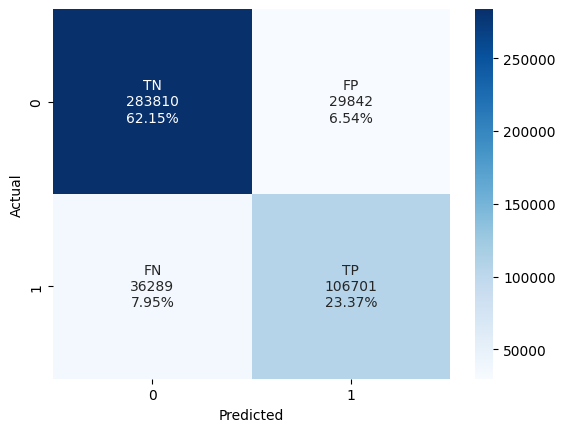

In [0]:
preds = lgb_gbm.predict(test_x)
pred_labels = np.rint(preds)

print(metrics.recall_score(test_y,pred_labels))

print(metrics.classification_report(test_y,pred_labels))

cfm = metrics.confusion_matrix(test_y, pred_labels)

group_names = ['TN','FP','FN','TP']
group_counts = ["{0:0.0f}".format(value) for value in
                cfm.flatten()]
group_percentages = ["{0:.2%}".format(value) for value in
                     cfm.flatten()/np.sum(cfm)]
labels = [f"{v1}\n{v2}\n{v3}" for v1, v2, v3 in
          zip(group_names,group_counts,group_percentages)]
labels = np.asarray(labels).reshape(2,2)
s = sns.heatmap(cfm, annot=labels, fmt='', cmap='Blues')
s.set(xlabel='Predicted', ylabel='Actual')

In [0]:

print(set(pred_labels))

{0.0, 1.0}


In [0]:
preds = lgb_gbm.predict(test_x)
pred_labels = np.rint(preds)

print(metrics.recall_score(test_y,pred_labels))
print(metrics.precision_score(test_y,pred_labels))
print(metrics.roc_auc_score(test_y,pred_labels))

0.7462130218896427
0.7814461378466857
0.8255346797433624


In [0]:
preds = cb_gbm.predict(test_x)
pred_labels = np.rint(preds)

print(metrics.recall_score(test_y,pred_labels))
print(metrics.precision_score(test_y,pred_labels))
print(metrics.roc_auc_score(test_y,pred_labels))

##MLflow Automation

In [0]:
import mlflow
import mlflow.lightgbm
from sklearn import metrics

In [0]:
# Define a name for the model in the MLflow Model Registry
MODEL_NAME = "PLCS_Propensity_Model"

In [0]:
# Retrain the final LightGBM model using the best parameters found by Optuna
# Assuming 'study' holds the results of objective_lgb optimization
best_params = study.best_trial.params
dtrain = lgb.Dataset(train_x, label=train_y)
lgb_gbm = lgb.train(best_params, dtrain)

In [0]:
# Evaluate performance (e.g., AUC)
preds = lgb_gbm.predict(test_x)
roc_auc = metrics.roc_auc_score(test_y, preds)

In [0]:
# Start an MLflow run to log all artifacts
with mlflow.start_run(run_name="PLCS_LGB_Model_Training") as run:
    
    # Log the parameters and the main metric
    mlflow.log_params(best_params)
    mlflow.log_metric("roc_auc_score", roc_auc)
    
    # Log the trained model and register it in the Model Registry
    # This automatically creates a new version
    mlflow.lightgbm.log_model(
        lgb_gbm, 
        artifact_path="lgbm_model", 
        registered_model_name=MODEL_NAME
    )
    
    print(f"MLflow Run ID: {run.info.run_id}")
    print(f"New Model Version Registered as: {MODEL_NAME}")

2025/11/06 11:49:09 WARNING mlflow.models.model: Model logged without a signature and input example. Please set `input_example` parameter when logging the model to auto infer the model signature.


Uploading artifacts:   0%|          | 0/9 [00:00<?, ?it/s]

Successfully registered model 'PLCS_Propensity_Model'.
2025/11/06 11:49:11 INFO mlflow.store.model_registry.abstract_store: Waiting up to 300 seconds for model version to finish creation. Model name: PLCS_Propensity_Model, version 1
Created version '1' of model 'PLCS_Propensity_Model'.


MLflow Run ID: 1f39908d451a41b6924c614311ea397c
New Model Version Registered as: PLCS_Propensity_Model
🏃 View run PLCS_LGB_Model_Training at: https://adb-7807160071083369.9.azuredatabricks.net/ml/experiments/1255184448117797/runs/1f39908d451a41b6924c614311ea397c
🧪 View experiment at: https://adb-7807160071083369.9.azuredatabricks.net/ml/experiments/1255184448117797
